<a href="https://colab.research.google.com/github/pscabral/IFMASOFTEX_1/blob/main/Yolo8_v1.3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install mega.py

from mega import Mega

# Crie uma instância da classe Mega
mega = Mega()

# Cole o link completo do Mega.nz (incluindo a chave)
url = "https://mega.nz/file/IutEjTyL#1SKwDXDjvmyvHjl7GxRM9kx2blr12R_5utVac9FU-LU"

# Use o link completo para fazer o download
mega.download_url(url)

!unzip w251final.v2i.yolov8.zip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 36.5 MB/s eta 0:00:00
  Attempting uninstall: tenacity
    Found existing installation: tenacity 8.2.3
    Uninstalling tenacity-8.2.3:
      Successfully uninstalled tenacity-8.2.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotly 5.15.0 requires tenacity>=6.2.0, but you have tenacity 5.1.5 which is incompatible.
Archive:  w251final.v2i.yolov8.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/128_100_jpg.rf.bd40f7a6439f0b46c4ad6f6e47e7a438.jpg  
 extracting: test/images/130_100_jpg.rf.a8028426abe9e63800bd2e525ee152ac.jpg  
 extracting: test/images/1389_jpg.rf.2f8a48602f5599c94406276add1c2428.jpg  
 extracting: test/images/1399_jpg.rf.f0f520d02ceee2e9c44e48b1325721

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.5/660.5 kB 9.3 MB/s eta 0:00:00


In [3]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

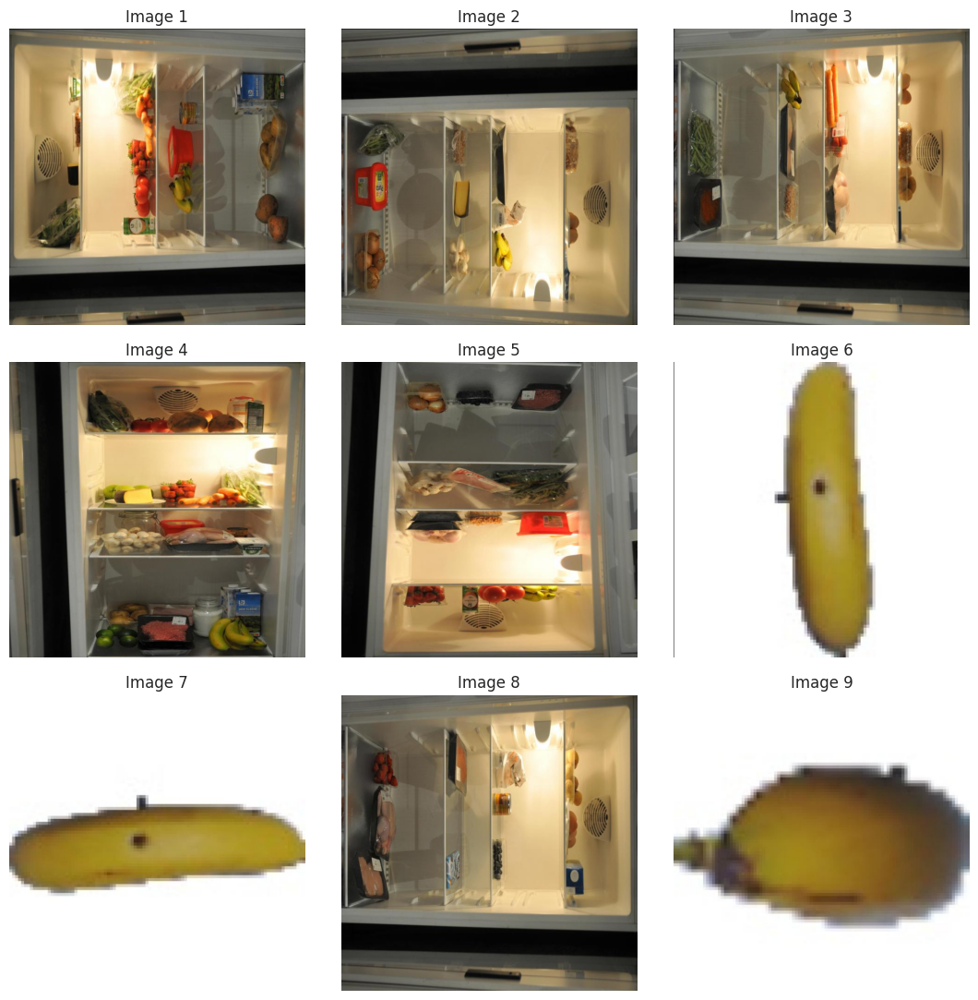

In [4]:
Image_dir = '/content/w251final.v2i/train/images'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [5]:
image = cv2.imread("/content/w251final.v2i/train/images/104_100_jpg.rf.27d8395e119e884e298243464aad67ec.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 640x640 and 3 channels.


100%|██████████| 6.23M/6.23M [00:00<00:00, 306MB/s]



image 1/1 /content/w251final.v2i/train/images/104_100_jpg.rf.27d8395e119e884e298243464aad67ec.jpg: 640x640 (no detections), 7.9ms
Speed: 5.2ms preprocess, 7.9ms inference, 117.0ms postprocess per image at shape (1, 3, 640, 640)


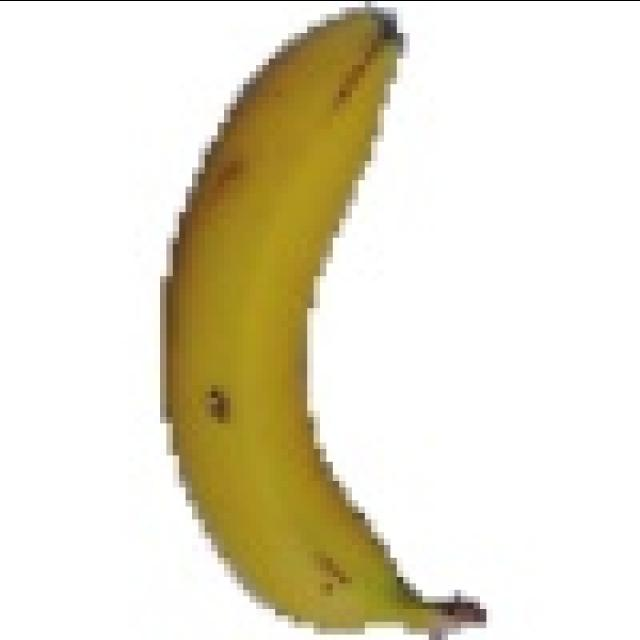

In [6]:
model = YOLO("yolov8n.pt")

# Use the model to detect object
image = "/content/w251final.v2i/train/images/104_100_jpg.rf.27d8395e119e884e298243464aad67ec.jpg"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [32]:
Final_model = YOLO('yolov8n.pt')
Result_Final_model = Final_model.train(data="/content/w251final.v2i/data.yaml", epochs=10, imgsz=640, batch=64, lr0=0.0001, dropout=0.15, device='cpu')


Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.00GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/w251final.v2i/data.yaml, epochs=10, patience=50, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=to

train: Scanning /content/w251final.v2i/train/labels.cache... 1967 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1967/1967 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/w251final.v2i/valid/labels.cache... 204 images, 0 backgrounds, 0 corrupt: 100%|██████████| 204/204 [00:00<?, ?it/s]

Plotting labels to runs/detect/train2/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000286, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10     0.241G      1.305      4.412      1.227        301        640: 100%|██████████| 31/31 [07:16<00:00, 14.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:16<00:00,  8.13s/it]

                   all        204       1369      0.355     0.0213     0.0278     0.0261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10    0.0818G       1.13      2.997      1.124        341        640: 100%|██████████| 31/31 [07:15<00:00, 14.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.82s/it]

                   all        204       1369     0.0534      0.839      0.252      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10    0.0818G      1.066      1.908      1.117        348        640: 100%|██████████| 31/31 [07:15<00:00, 14.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.54s/it]

                   all        204       1369      0.748       0.28      0.591      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10    0.0818G       1.02      1.388      1.095        291        640: 100%|██████████| 31/31 [07:17<00:00, 14.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:16<00:00,  8.05s/it]

                   all        204       1369      0.713       0.67      0.768      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10    0.0818G      0.994      1.151      1.081        300        640: 100%|██████████| 31/31 [07:08<00:00, 13.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.73s/it]

                   all        204       1369      0.753      0.803      0.861      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10    0.0818G     0.9695      1.034      1.067        300        640: 100%|██████████| 31/31 [07:15<00:00, 14.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:16<00:00,  8.00s/it]

                   all        204       1369      0.845      0.843      0.903      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10    0.0818G     0.9485      0.953      1.054        292        640: 100%|██████████| 31/31 [07:11<00:00, 13.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.74s/it]

                   all        204       1369       0.88       0.88      0.921      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10    0.0818G     0.9295     0.8984      1.049        290        640: 100%|██████████| 31/31 [07:13<00:00, 13.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.88s/it]

                   all        204       1369      0.858      0.894      0.933      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10    0.0818G     0.9096     0.8565      1.046        298        640: 100%|██████████| 31/31 [07:13<00:00, 13.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.99s/it]

                   all        204       1369      0.907      0.892      0.942      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10    0.0818G     0.9034      0.835      1.033        367        640: 100%|██████████| 31/31 [07:13<00:00, 13.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.81s/it]

                   all        204       1369      0.897      0.907      0.944      0.673



10 epochs completed in 1.252 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.3MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 168 layers, 3011693 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.63s/it]


                   all        204       1369      0.899      0.905      0.944      0.673
                 apple        204         36      0.854      0.944       0.95      0.698
                banana        204        144      0.985          1      0.995      0.942
                  beef        204         30      0.817      0.298      0.688      0.419
           blueberries        204         38      0.944      0.974      0.975      0.614
                 bread        204         30      0.969          1      0.995      0.735
                butter        204         38      0.924          1      0.995      0.782
              capsicum        204          4       0.83          1      0.995      0.692
                carrot        204         42      0.942      0.881      0.962      0.695
                cheese        204         55      0.981      0.927      0.981       0.72
               chicken        204         43      0.916      0.977      0.993      0.761
        chicken_breas

In [34]:
!yolo task=detect mode=val model=/content/runs/detect/train2/weights/best.pt data=/content/w251final.v2i/data.yaml conf=0.5


Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 168 layers, 3011693 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/w251final.v2i/valid/labels.cache... 204 images, 0 backgrounds, 0 corrupt: 100% 204/204 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 13/13 [00:20<00:00,  1.58s/it]
                   all        204       1369      0.953      0.859      0.913       0.69
                 apple        204         36      0.914      0.889      0.918      0.699
                banana        204        144      0.993          1      0.995       0.96
                  beef        204         30          1     0.0667      0.533      0.508
           blueberries        204         38      0.974      0.974      0.986      0.661
                 bread        204         30          1          1      0.995      0.766
                butter        204         38     

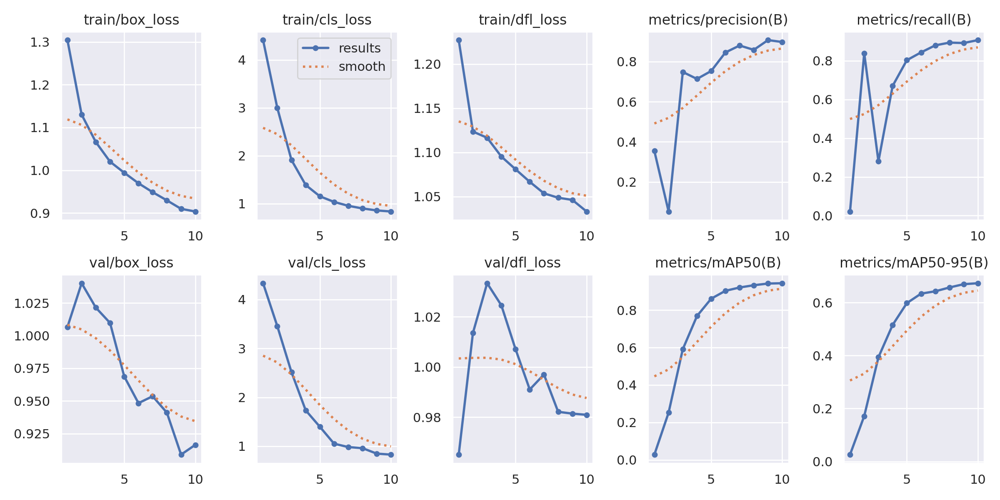

In [35]:
from IPython.display import Image

Image(filename=f'/content/runs/detect/train2/results.png', height=800)

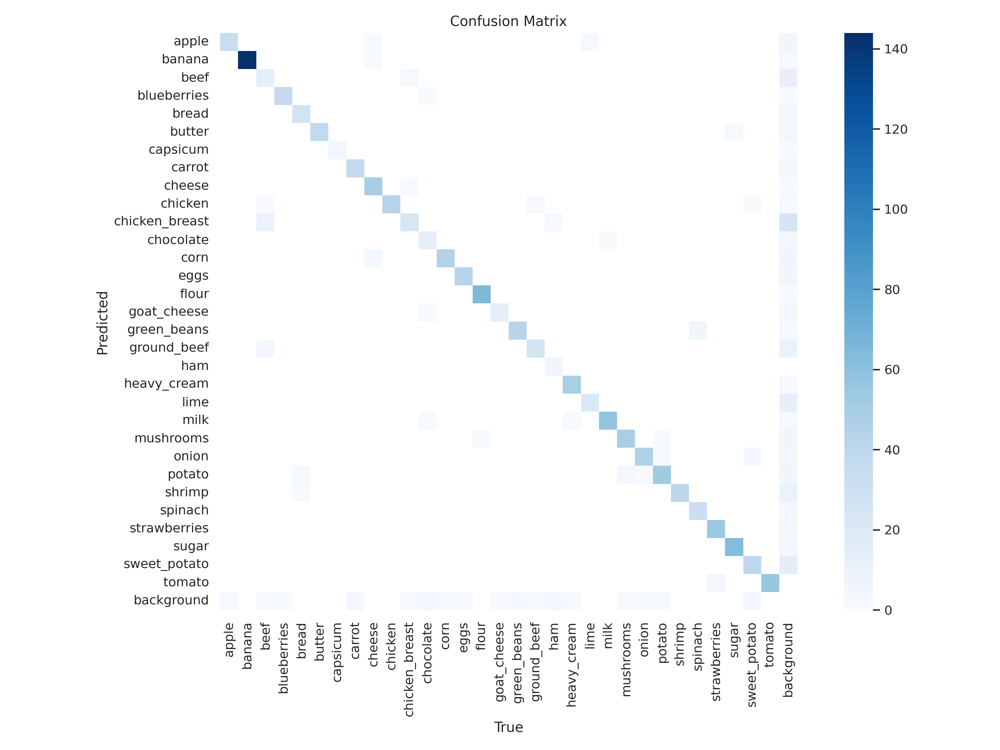

In [36]:
Image(filename=f'/content/runs/detect/train2/confusion_matrix.png', width=800)

In [113]:
!yolo task=detect mode=predict model=/content/runs/detect/train2/weights/best.pt conf=0.4 source=/content/w251final.v2i/valid/images save=True

Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 168 layers, 3011693 parameters, 0 gradients, 8.1 GFLOPs

image 1/204 /content/w251final.v2i/valid/images/0_100_jpg.rf.f1cc133677a85f6b59cdc0f4869e68bd.jpg: 640x640 1 banana, 135.1ms
image 2/204 /content/w251final.v2i/valid/images/121_100_jpg.rf.ecf2ff5bdf6f3ef75f5d4c747e393d44.jpg: 640x640 1 banana, 89.8ms
image 3/204 /content/w251final.v2i/valid/images/131_100_jpg.rf.dafef839f1e9c18b296dff270ce058bf.jpg: 640x640 1 banana, 82.1ms
image 4/204 /content/w251final.v2i/valid/images/132_100_jpg.rf.eea7150994bd0bae36ad7d377499030f.jpg: 640x640 1 banana, 84.6ms
image 5/204 /content/w251final.v2i/valid/images/1386_jpg.rf.887a0318ea7f7e10110b1e92414120e1.jpg: 640x640 1 capsicum, 85.4ms
image 6/204 /content/w251final.v2i/valid/images/1390_jpg.rf.9ec21fef3b794939a6d382bd0356dc8a.jpg: 640x640 1 capsicum, 96.2ms
image 7/204 /content/w251final.v2i/valid/images/1395_jpg.rf.f37aa0bb652dd1aea7142f

FileNotFoundError: ignored

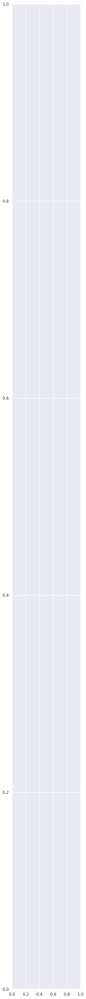

In [114]:
import matplotlib.pyplot as plt
import os
import random
from PIL import Image as PILImage

plt.figure(figsize = (20, 50))
for i in range(5):
    plt.subplot(1,5,i+1)
    sample_path = random.choice(os.listdir("/content/runs/detect/predict11"))
    img = PILImage.open("/content/runs/detect/predict11/" + sample_path)
    plt.imshow(img)

plt.tight_layout()


In [101]:
model = YOLO("/content/runs/detect/train2/weights/best.pt")
results = model.predict(source="/content/w251final.v2i/valid/images/DSC_5723_JPG_jpg.rf.500bb919805a128f9d72bdad36cb64e9.jpg", conf=0.40)


image 1/1 /content/w251final.v2i/valid/images/DSC_5723_JPG_jpg.rf.500bb919805a128f9d72bdad36cb64e9.jpg: 640x640 1 apple, 1 butter, 1 carrot, 1 cheese, 1 chicken, 1 flour, 1 green_beans, 2 milks, 1 potato, 1 strawberries, 1 sugar, 1 sweet_potato, 7.5ms
Speed: 1.7ms preprocess, 7.5ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


In [104]:
print("Bounding box coordinates:", results[0].boxes.xyxy)
print("Log probability of assigned class", results[0].boxes.conf)
print("Assigned class:", results[0].boxes.cls)

Bounding box coordinates: tensor([[432.1724, 119.5496, 488.3313, 149.4204],
        [294.4794, 362.6731, 398.9694, 411.7139],
        [401.7910, 349.6177, 529.5964, 406.3505],
        [291.6664, 274.3365, 452.8845, 316.7973],
        [296.5020, 477.2725, 355.2407, 580.0849],
        [466.4303, 264.4760, 544.7487, 312.0157],
        [203.4668, 505.9673, 298.0369, 600.9377],
        [194.9651, 346.5582, 301.7939, 407.7339],
        [346.8515, 477.6923, 414.2209, 582.7686],
        [202.9019, 263.8002, 293.0110, 315.1289],
        [419.9106, 524.6243, 530.3902, 585.3021],
        [189.0355,  69.5368, 254.5798, 155.4729],
        [247.2978, 123.2842, 390.4522, 156.8227]], device='cuda:0')
Log probability of assigned class tensor([0.9715, 0.9588, 0.9488, 0.9440, 0.9393, 0.9383, 0.9185, 0.9168, 0.9022, 0.8795, 0.8638, 0.8487, 0.8228], device='cuda:0')
Assigned class: tensor([ 8., 24.,  9., 16., 21., 29., 14.,  5., 21., 27.,  0., 28.,  7.], device='cuda:0')


In [112]:
!yolo task=detect mode=predict model=/content/runs/detect/train2/weights/best.pt conf=0.4 source=/content/1istockphoto-1008485276-640_adpp_is.mp4 save=True

Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 168 layers, 3011693 parameters, 0 gradients, 8.1 GFLOPs

video 1/1 (1/320) /content/1istockphoto-1008485276-640_adpp_is.mp4: 384x640 2 apples, 2 bananas, 1 butter, 1 spinach, 1 sugar, 1 sweet_potato, 4 tomatos, 81.9ms
video 1/1 (2/320) /content/1istockphoto-1008485276-640_adpp_is.mp4: 384x640 2 apples, 2 bananas, 1 butter, 1 spinach, 1 sugar, 1 sweet_potato, 4 tomatos, 45.4ms
video 1/1 (3/320) /content/1istockphoto-1008485276-640_adpp_is.mp4: 384x640 2 apples, 2 bananas, 1 butter, 1 green_beans, 1 sweet_potato, 4 tomatos, 45.1ms
video 1/1 (4/320) /content/1istockphoto-1008485276-640_adpp_is.mp4: 384x640 2 apples, 1 banana, 1 butter, 1 green_beans, 1 sweet_potato, 4 tomatos, 40.8ms
video 1/1 (5/320) /content/1istockphoto-1008485276-640_adpp_is.mp4: 384x640 1 apple, 1 banana, 1 butter, 1 green_beans, 1 spinach, 1 sweet_potato, 4 tomatos, 47.3ms
video 1/1 (6/320) /content/1istockpho

In [106]:
from google.colab import files

# Substitua 'seu_arquivo.avi' pelo nome do seu arquivo.
files.download('/content/runs/detect/predict4/istockphoto-1222821300-640_adpp_is.avi')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [67]:
paths2=[]
for dirname, _, filenames in os.walk('/content/runs/detect/train2'):
    for filename in filenames:
        if filename[-4:]=='.jpg':
            paths2+=[(os.path.join(dirname, filename))]
paths2=sorted(paths2)

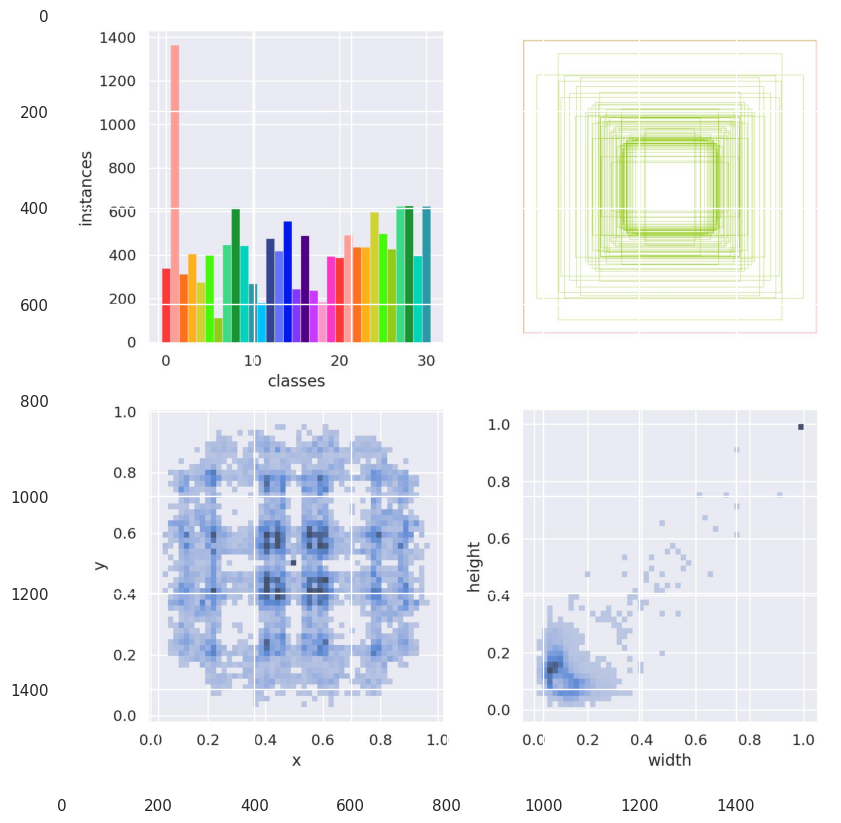

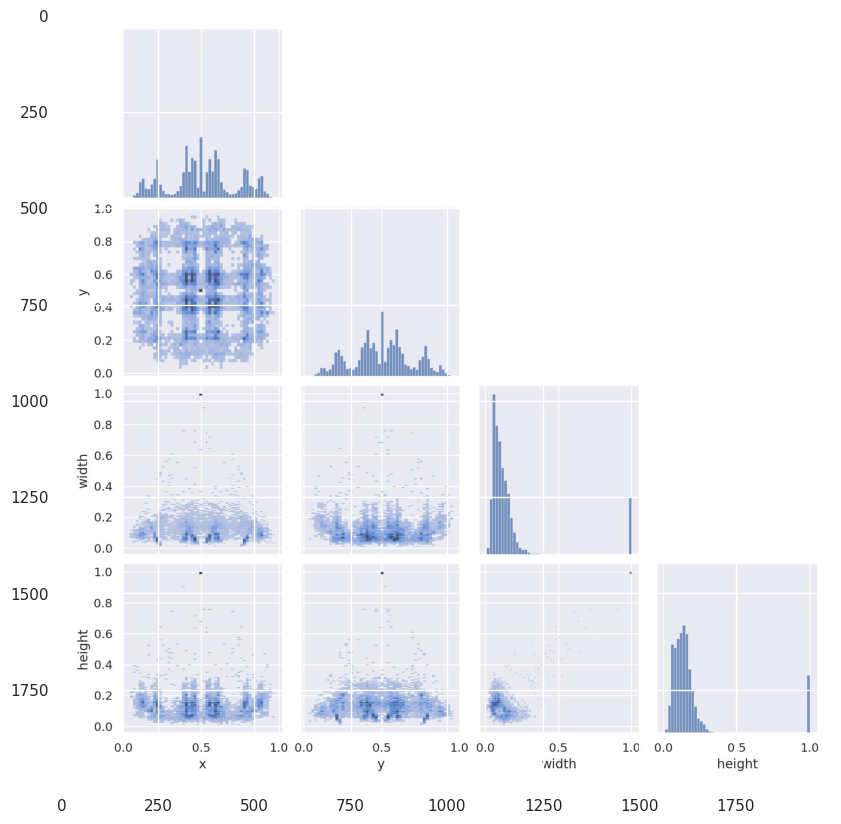

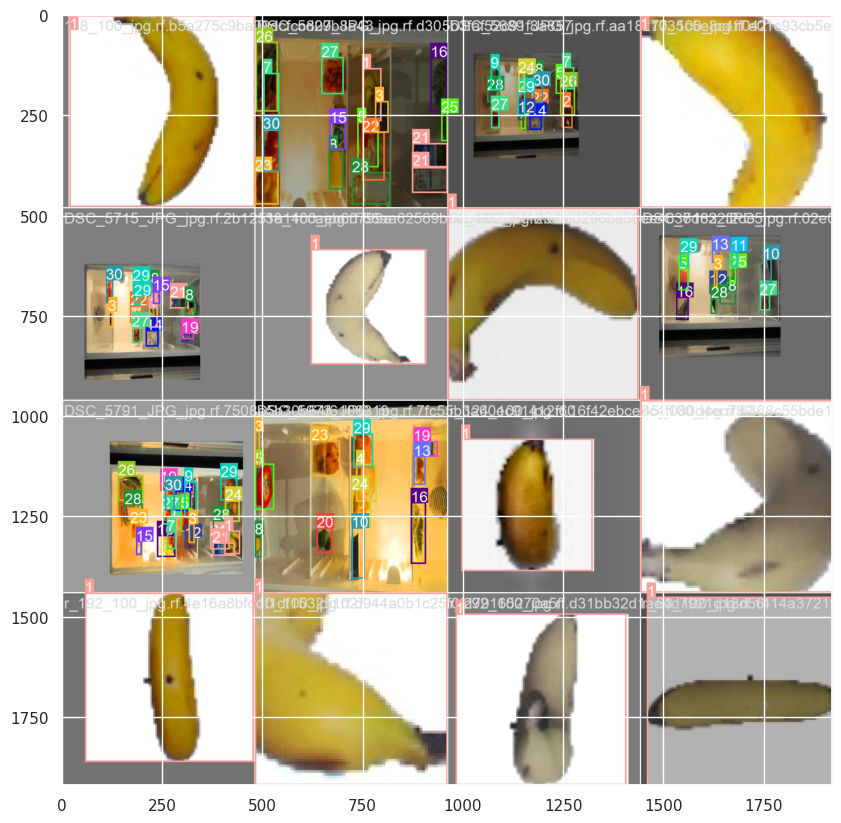

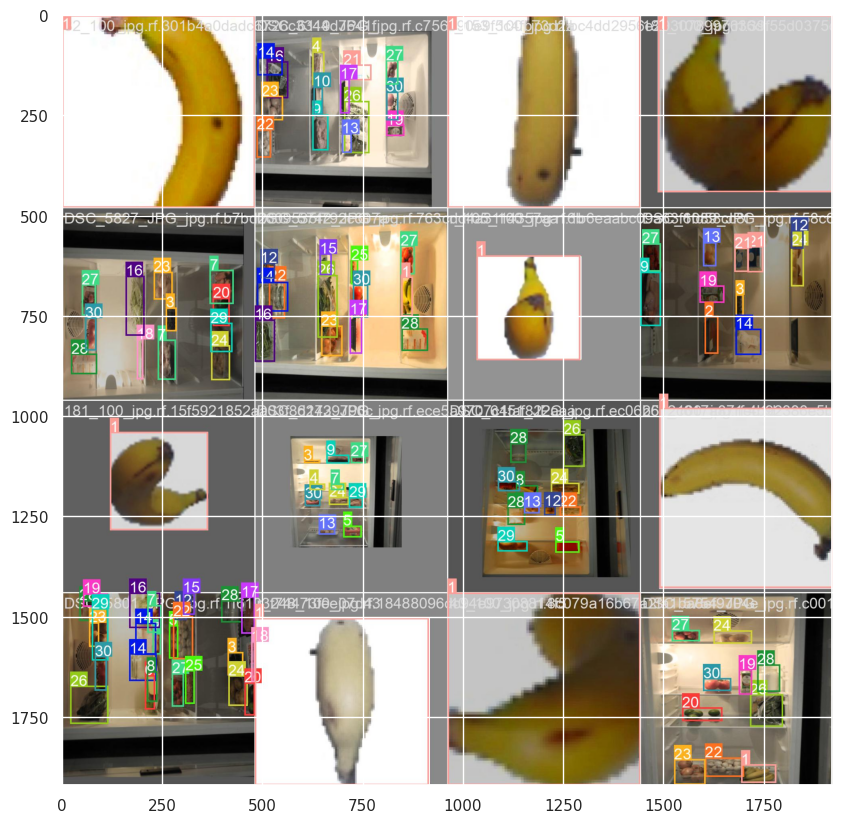

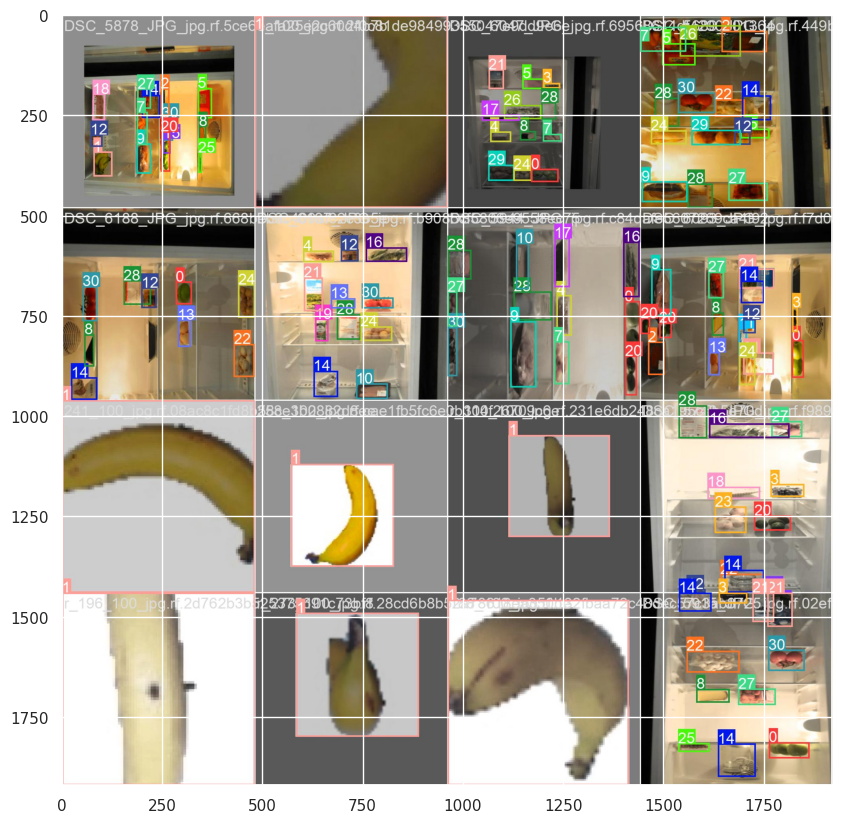

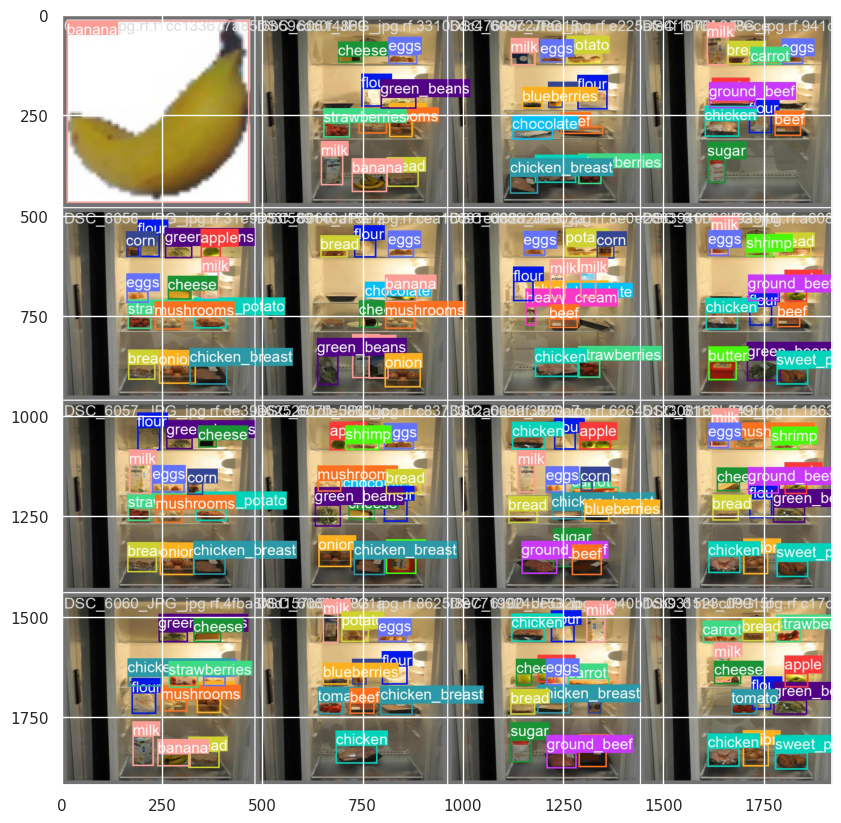

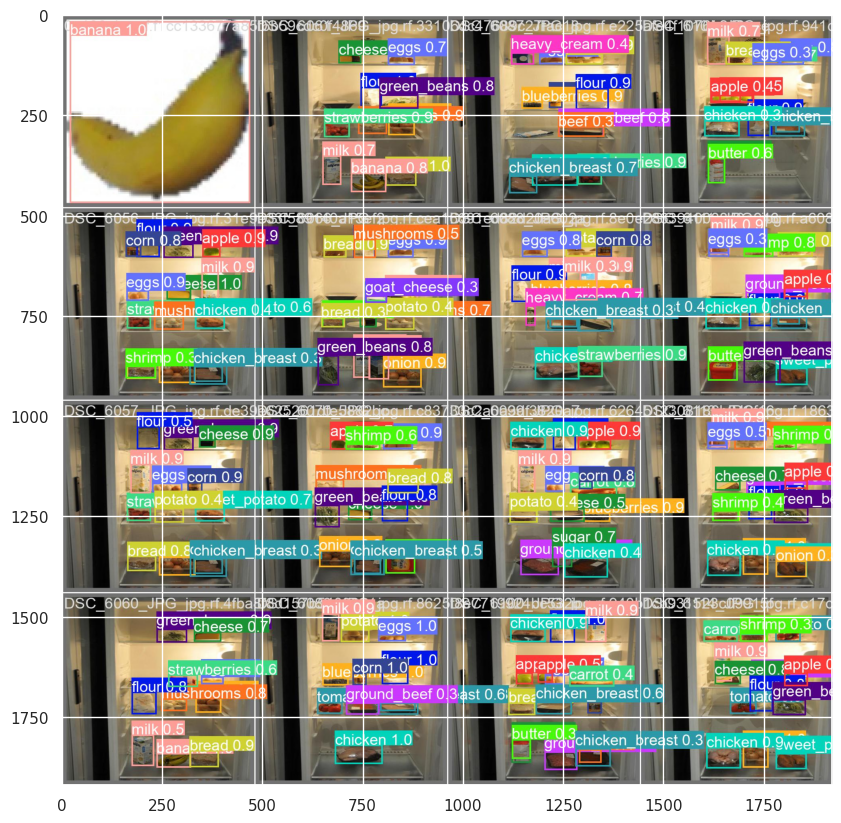

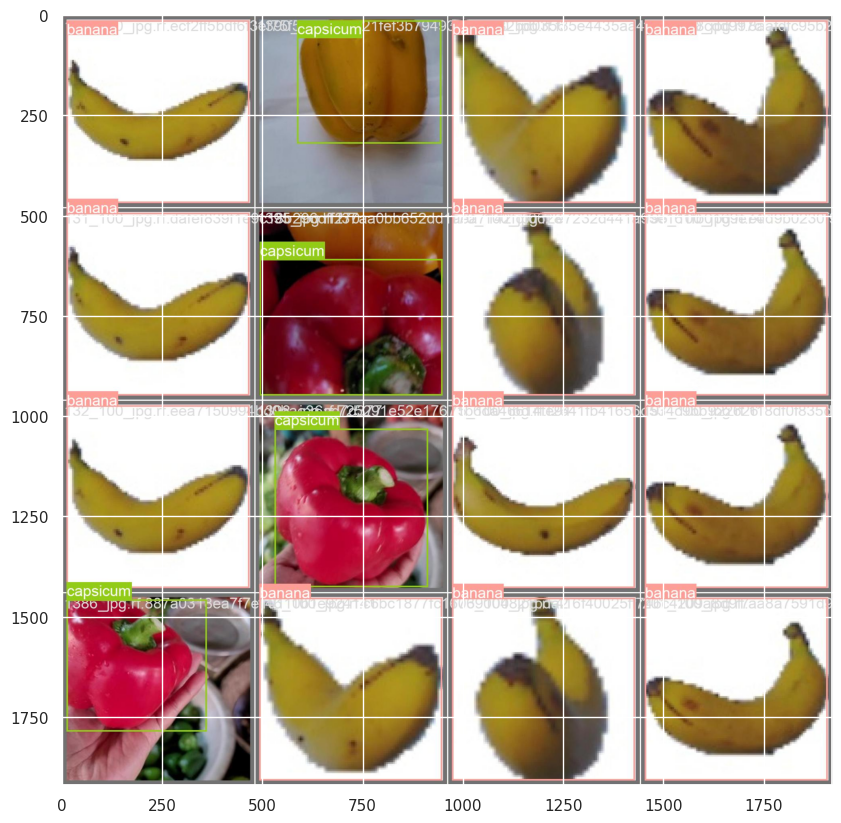

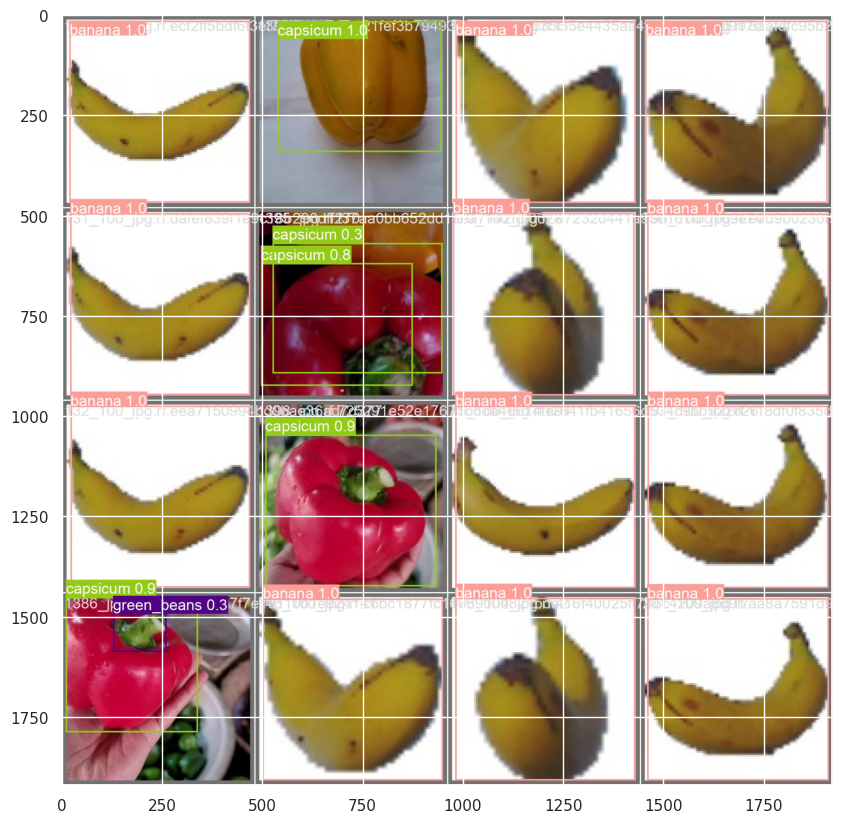

In [70]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Rest of your code
for path in paths2:
    image = Image.open(path)
    image = np.array(image)
    plt.figure(figsize=(20, 10))
    plt.imshow(image)
    plt.show()


In [71]:
best_path0='/content/runs/detect/train2/weights/best.pt'
source0='/content/w251final.v2i/valid/images'

In [72]:
ppaths=[]
for dirname, _, filenames in os.walk(source0):
    for filename in filenames:
        if filename[-4:]=='.jpg':
            ppaths+=[(os.path.join(dirname, filename))]
ppaths=sorted(ppaths)
print(ppaths[0])
print(len(ppaths))

/content/w251final.v2i/valid/images/0_100_jpg.rf.f1cc133677a85f6b59cdc0f4869e68bd.jpg
204


In [73]:
model2 = YOLO(best_path0)

In [ ]:
!yolo task=detect mode=predict model={best_path0} conf=0.4 source={source0}

In [ ]:
results = model2.predict(source0,conf=0.4)
print(len(results))

In [76]:
print((results[0].boxes.data))

tensor([[6.1853e-01, 3.5303e-01, 6.3967e+02, 6.4000e+02, 9.9088e-01, 1.0000e+00]], device='cuda:0')


In [77]:
PBOX=pd.DataFrame(columns=range(6))
for i in range(len(results)):
    arri=pd.DataFrame(results[i].boxes.data.cpu().numpy()).astype(float)
    path=ppaths[i]
    file=path.split('/')[-1]
    arri=arri.assign(file=file)
    arri=arri.assign(i=i)
    PBOX=pd.concat([PBOX,arri],axis=0)
PBOX.columns=['x','y','x2','y2','confidence','class','file','i']
display(PBOX)

,x,y,x2,y2,confidence,class,file,i
0,0.618530,0.353027,639.670654,640.000000,0.990877,1.0,0_100_jpg.rf.f1cc133677a85f6b59cdc0f4869e68bd.jpg,0.0
0,0.884155,0.245850,639.954712,640.000000,0.990865,1.0,121_100_jpg.rf.ecf2ff5bdf6f3ef75f5d4c747e393d4...,1.0
0,0.629578,0.103638,639.711487,639.366211,0.987367,1.0,131_100_jpg.rf.dafef839f1e9c18b296dff270ce058b...,2.0
0,1.553345,0.176880,639.420166,640.000000,0.988916,1.0,132_100_jpg.rf.eea7150994bd0bae36ad7d377499030...,3.0
0,0.621704,3.354279,456.108704,470.817261,0.970739,6.0,1386_jpg.rf.887a0318ea7f7e10110b1e92414120e1.jpg,4.0
...,...,...,...,...,...,...,...,...
0,1.221375,0.527100,640.000000,640.000000,0.994758,1.0,r_4_100_jpg.rf.6fb1b8597e18204c21f4e6c9350e808...,199.0
0,1.115906,0.196411,639.928772,640.000000,0.992132,1.0,r_64_100_jpg.rf.22ba0ca3e161de4b3cfb962e8a071b...,200.0
0,0.796997,0.652649,639.012207,640.000000,0.995214,1.0,r_81_100_jpg.rf.abe88d5594dccef7cfebe689e9143e...,201.0
0,0.933838,0.500488,639.598511,640.000000,0.994267,1.0,r_85_100_jpg.rf.4db3ac8ab98ffeab0b15e28ce6b6b9...,202.0


In [78]:
PBOX['class']=PBOX['class'].apply(lambda x: class_map[int(x)])
PBOX=PBOX.reset_index(drop=True)
display(PBOX)
display(PBOX['class'].value_counts())

NameError: ignored

In [79]:
def draw_box2(n0):

    ipath=ppaths[n0]
    image=cv2.imread(ipath)
    H,W=image.shape[0],image.shape[1]
    file=ipath.split('/')[-1]

    if PBOX[PBOX['file']==file] is not None:
        box=PBOX[PBOX['file']==file]
        box=box.reset_index(drop=True)
        #display(box)

        for i in range(len(box)):
            label=box.loc[i,'class']
            x=int(box.loc[i,'x'])
            y=int(box.loc[i,'y'])
            x2=int(box.loc[i,'x2'])
            y2=int(box.loc[i,'y2'])
            #print(label,x,y,x2,y2)
            #cv2.putText(image, f'{label}', (x, int(y-4)),
            #            cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0,255,0),2)
            cv2.rectangle(image,(x,y),(x2,y2),(0,255,0),2) #green

    #plt.imshow(image)
    #plt.show()

    return image

In [80]:
def create_animation(ims):
    fig=plt.figure(figsize=(12,8))
    im=plt.imshow(cv2.cvtColor(ims[0],cv2.COLOR_BGR2RGB))
    text = plt.text(0.05, 0.05, f'Slide {0}', transform=fig.transFigure, fontsize=14, color='blue')
    plt.axis('off')
    plt.close()

    def animate_func(i):
        im.set_array(cv2.cvtColor(ims[i],cv2.COLOR_BGR2RGB))
        text.set_text(f'Slide {i}')
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval=1000)

In [81]:
images2=[]
for i in tqdm(range(len(ppaths))):
    images2+=[draw_box2(i)]

  0%|          | 0/204 [00:00<?, ?it/s]

In [82]:
create_animation(images2)

In [83]:
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time
import matplotlib.pyplot as plt
%matplotlib inline

In [84]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!git clone https://github.com/AlexeyAB/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 15833, done.
remote: Total 15833 (delta 0), reused 0 (delta 0), pack-reused 15833
Receiving objects: 100% (15833/15833), 14.39 MiB | 14.57 MiB/s, done.
Resolving deltas: 100% (10666/10666), done.


In [85]:
# change makefile to have GPU, OPENCV and LIBSO enabled
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!sed -i 's/CUDNN_HALF=0/CUDNN_HALF=1/' Makefile
!sed -i 's/LIBSO=0/LIBSO=1/' Makefile

/content/darknet


In [86]:
!make

mkdir -p ./obj/
mkdir -p backup
mkdir -p results
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -DCUDNN_HALF -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -rdynamic -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -DCUDNN_HALF -fPIC -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:945:23: warning: variable ‘rgb’ set but not used []8;;https://gcc.gnu.org/onlinedocs/gcc/Warning-Options.html#index-Wunused-but-set-variable-Wunused-but-set-variable]8;;]
  945 |                 float rgb[3];
      |                       ^~~
./src/image_opencv.cpp: In function ‘void cv_draw_object(image, float*, int, int, int*, float*, int*, int, char**)’:
./src/image_opencv.cpp:1443:

In [87]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq" -O yolov4-csp.weights && rm -rf /tmp/cookies.txt

--2023-12-17 20:04:31--  https://docs.google.com/uc?export=download&confirm=t&id=1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq
Resolving docs.google.com (docs.google.com)... 172.253.118.138, 172.253.118.139, 172.253.118.101, ...
Connecting to docs.google.com (docs.google.com)|172.253.118.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-14-84-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/a04cr76okdpshuh1avdqo66871pvkp3e/1702843425000/17800843676226924807/*/1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq?e=download&uuid=81cae572-0afa-4f61-b1d2-a7755da25087 [following]
--2023-12-17 20:04:32--  https://doc-14-84-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/a04cr76okdpshuh1avdqo66871pvkp3e/1702843425000/17800843676226924807/*/1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq?e=download&uuid=81cae572-0afa-4f61-b1d2-a7755da25087
Resolving doc-14-84-docs.googleusercontent.com (doc-14-84-docs.googleusercontent.com)... 142.251.10.1

In [88]:
from darknet import *
network, class_names, class_colors = load_network("/content/darknet/cfg/yolov4-csp.cfg", "/content/darknet/cfg/coco.data", "/content/darknet/yolov4-csp.weights")
width = network_width(network)
height = network_height(network)

def darknet_helper(img, width, height):
  darknet_image = make_image(width, height, 3)
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_resized = cv2.resize(img_rgb, (width, height),
                              interpolation=cv2.INTER_LINEAR)

  img_height, img_width, _ = img.shape
  width_ratio = img_width/width
  height_ratio = img_height/height

  copy_image_from_bytes(darknet_image, img_resized.tobytes())
  detections = detect_image(network, class_names, darknet_image)
  free_image(darknet_image)
  return detections, width_ratio, height_ratio

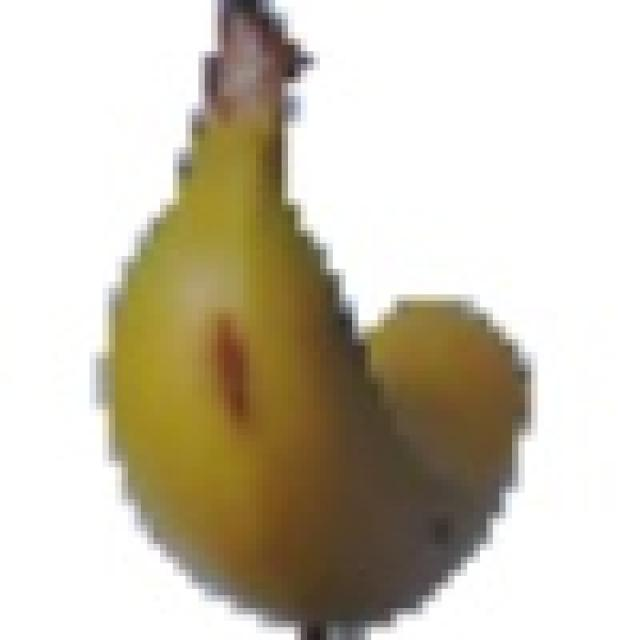

In [89]:
# run test on person.jpg image that comes with repository
image = cv2.imread("/content/w251final.v2i/valid/images/323_100_jpg.rf.5d56ffb778f491e1325a6617f1345c0a.jpg")
detections, width_ratio, height_ratio = darknet_helper(image, width, height)

for label, confidence, bbox in detections:
  left, top, right, bottom = bbox2points(bbox)
  left, top, right, bottom = int(left * width_ratio), int(top * height_ratio), int(right * width_ratio), int(bottom * height_ratio)
  cv2.rectangle(image, (left, top), (right, bottom), class_colors[label], 2)
  cv2.putText(image, "{} [{:.2f}]".format(label, float(confidence)),
                    (left, top - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                    class_colors[label], 2)
cv2_imshow(image)

In [90]:
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """

  image_bytes = b64decode(js_reply.split(',')[1])

  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)

  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """

  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()

  bbox_PIL.save(iobuf, format='png')

  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

In [91]:
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

  # get photo data
  data = eval_js('takePhoto({})'.format(quality))
  # get OpenCV format image
  img = js_to_image(data)

  # call our darknet helper on webcam image
  detections, width_ratio, height_ratio = darknet_helper(img, width, height)

  # loop through detections and draw them on webcam image
  for label, confidence, bbox in detections:
    left, top, right, bottom = bbox2points(bbox)
    left, top, right, bottom = int(left * width_ratio), int(top * height_ratio), int(right * width_ratio), int(bottom * height_ratio)
    cv2.rectangle(img, (left, top), (right, bottom), class_colors[label], 2)
    cv2.putText(img, "{} [{:.2f}]".format(label, float(confidence)),
                      (left, top - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                      class_colors[label], 2)
  # save image
  cv2.imwrite(filename, img)

  return filename

<IPython.core.display.Javascript object>

Saved to photo.jpg


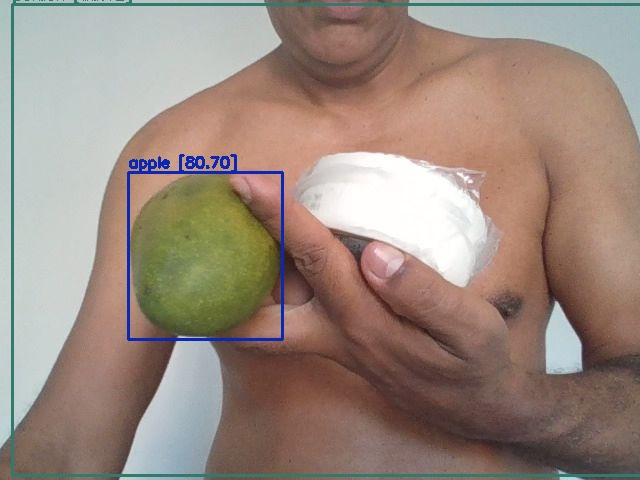

In [93]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [94]:
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;

    var pendingResolve = null;
    var shutdown = false;

    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }

    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }

    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);

      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);

      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);

      const instruction = document.createElement('div');
      instruction.innerHTML =
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };

      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);

      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();

      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }

      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }

      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;

      return {'create': preShow - preCreate,
              'show': preCapture - preShow,
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)

def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

In [95]:
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0
while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # convert JS response to OpenCV Image
    frame = js_to_image(js_reply["img"])

    # create transparent overlay for bounding box
    bbox_array = np.zeros([480,640,4], dtype=np.uint8)

    # call our darknet helper on video frame
    detections, width_ratio, height_ratio = darknet_helper(frame, width, height)

    # loop through detections and draw them on transparent overlay image
    for label, confidence, bbox in detections:
      left, top, right, bottom = bbox2points(bbox)
      left, top, right, bottom = int(left * width_ratio), int(top * height_ratio), int(right * width_ratio), int(bottom * height_ratio)
      bbox_array = cv2.rectangle(bbox_array, (left, top), (right, bottom), class_colors[label], 2)
      bbox_array = cv2.putText(bbox_array, "{} [{:.2f}]".format(label, float(confidence)),
                        (left, top - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                        class_colors[label], 2)

    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255
    # convert overlay of bbox into bytes
    bbox_bytes = bbox_to_bytes(bbox_array)
    # update bbox so next frame gets new overlay
    bbox = bbox_bytes

<IPython.core.display.Javascript object>

KeyboardInterrupt: ignored